In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize']=(10, 10)

In [2]:
path = "demo4.jpg"

# Task 1: đọc ảnh

In [3]:
def show(img, title = 'Gray Image', rgb = False, fs = 15, dp = (15, 15)):
    plt.rcParams.update({'font.size': fs})
    plt.rcParams['figure.figsize'] = dp
    if rgb:
        plt.imshow(img[:,:,::-1])
    else:
        plt.imshow(img, cmap=plt.cm.gray)
    plt.axis('off')
    plt.title(f'{title}')
    plt.show()

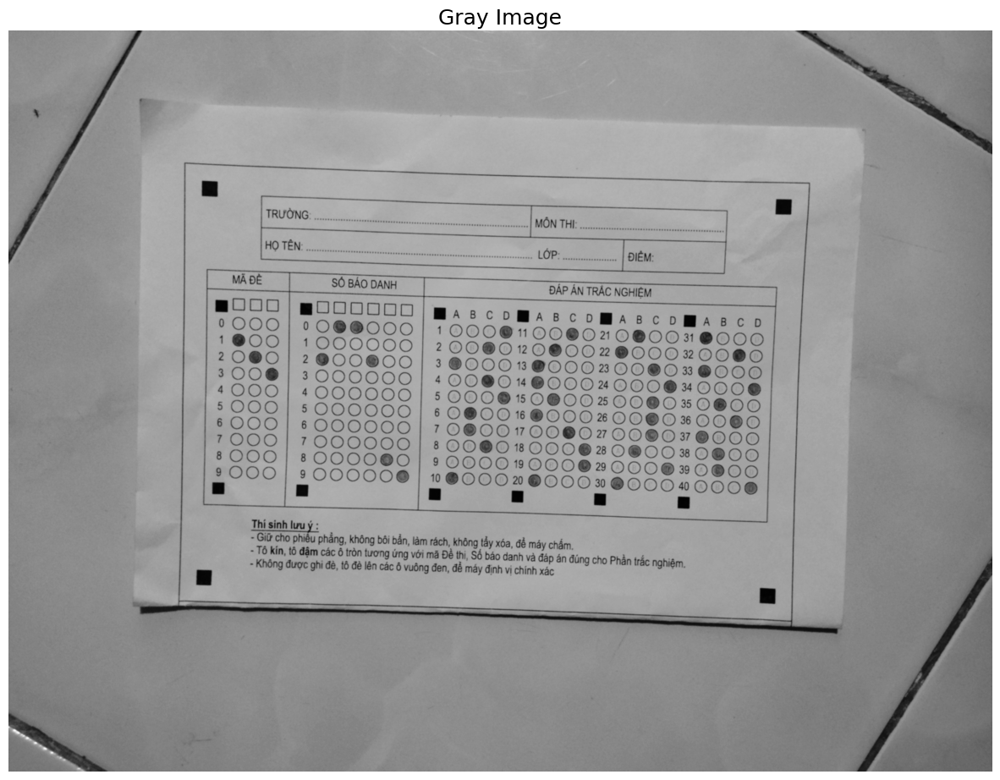

In [4]:
# 1. Đọc ảnh
image = cv2.imread(path)
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blur = cv2.GaussianBlur(gray, (5, 5), 0)
show(blur)

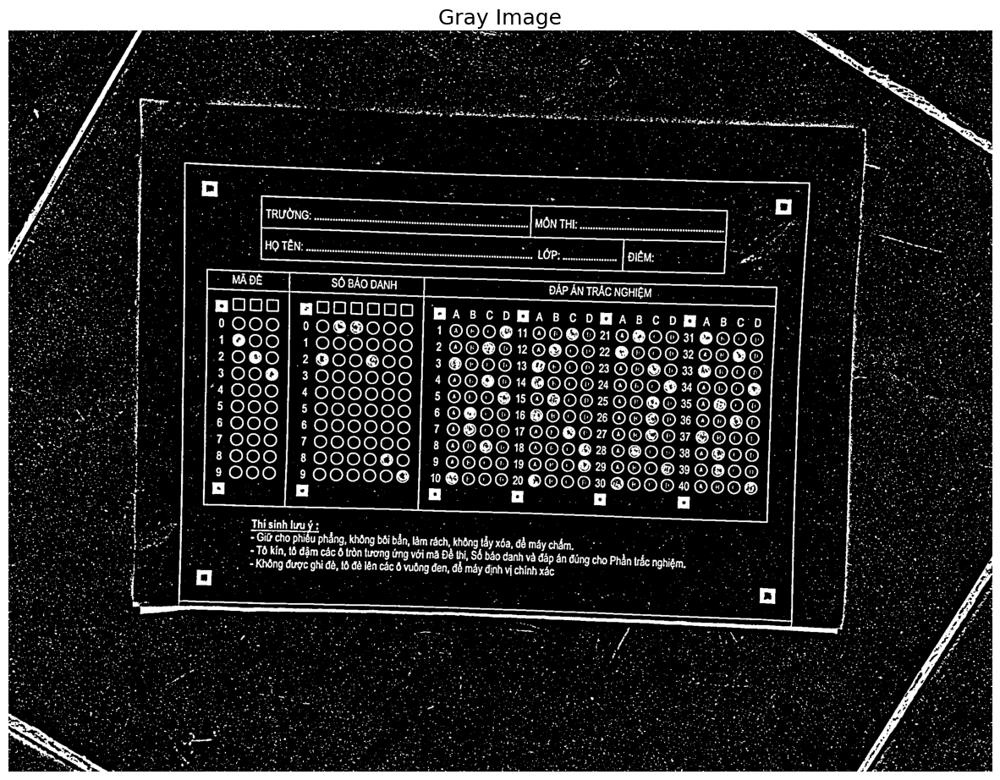

In [5]:
thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 31, 3)
show(thresh)

tổng hợp code

In [6]:
def task_1(path):
    '''Đọc ảnh và làm mịn.
    - Input: Đường dẫn ảnh.
    - Output: Ảnhr nhị phân đã được làm mịn'''
    image = cv2.imread(path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)
    return blur

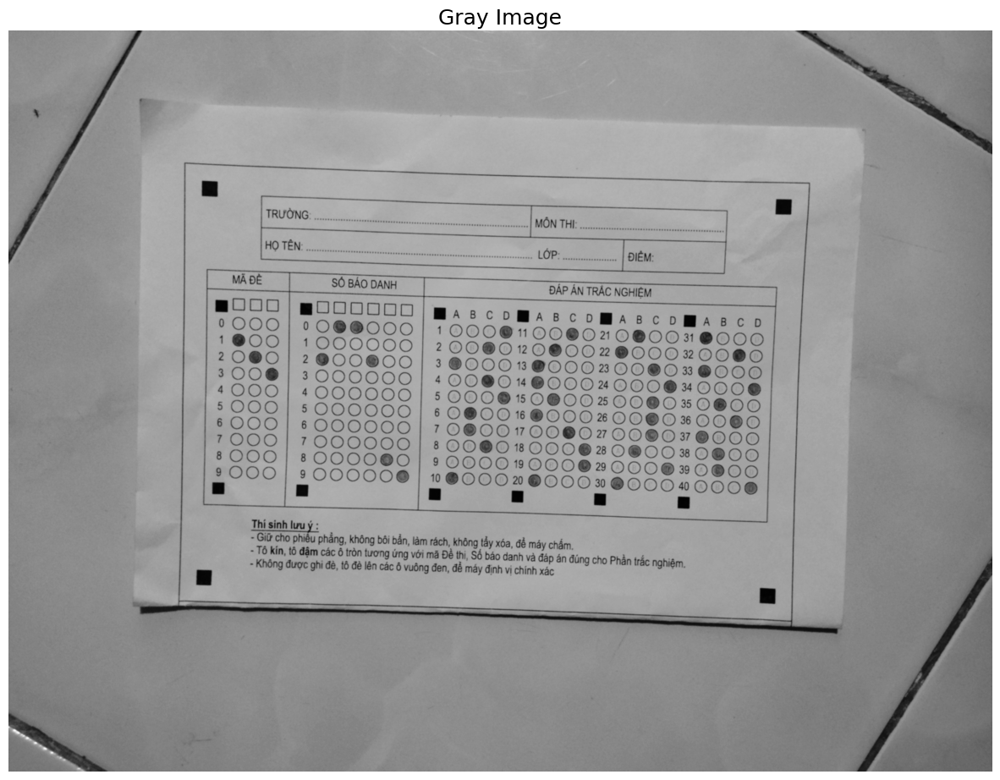

In [7]:
img = task_1(path)
show(img)

# Task 2: lấy phần giấy làm bài

In [8]:
def distance(p1,p2):
    my_dist = np.sqrt(((p1[0] - p2[0]) ** 2) + ((p1[1] - p2[1]) ** 2))
    return  my_dist
    
def order_points(pts):
    rect = np.zeros((4, 2), dtype="float32")
    s = pts.sum(axis=1)
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]

    diff = np.diff(pts, axis=1)
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]

    return rect

def four_point_transform(image, pts):
    rect = order_points(pts)
    (tl, tr, br, bl) = rect

    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))

    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))

    dst = np.array([[0, 0],
                    [maxWidth - 1, 0],
                    [maxWidth - 1, maxHeight - 1],
                    [0, maxHeight - 1]], dtype = "float32")
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
    return warped

def find_corner_by_rotated_rect(box,approx):
    corner = []
    for p_box in box:
        min_dist = 999999999
        min_p = None
        for p in approx:
            dist = distance(p_box, p[0])
            if dist < min_dist:
                min_dist = dist
                min_p = p[0]
        corner.append(min_p)

    corner = np.array(corner)
    return corner

In [9]:
# cắt ảnh theo diện tích
def get_area(img, id):
    thresh = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 31, 3)
    cnts = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[0]
    cnts = sorted(cnts, key=lambda x: cv2.contourArea(x),reverse=True)
    approx = cv2.approxPolyDP(cnts[id], 0.01 * cv2.arcLength(cnts[id], True), True)
    rect = cv2.minAreaRect(cnts[id])
    box = cv2.boxPoints(rect)
    corner = find_corner_by_rotated_rect(box, approx)
    res = four_point_transform(img, corner)
    return res

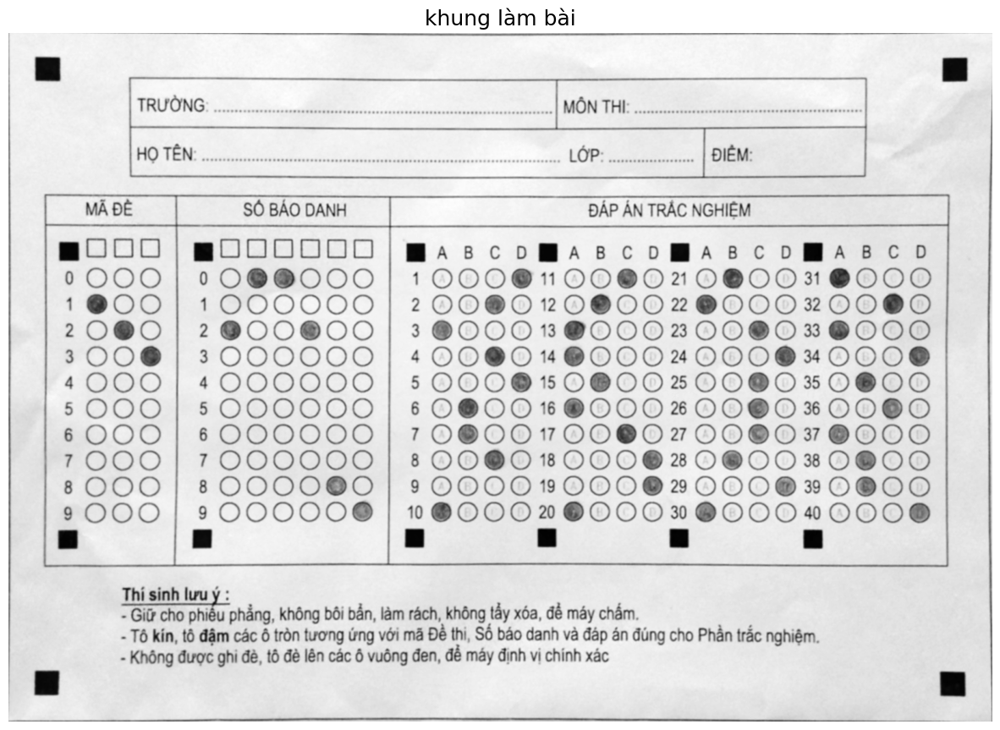

In [10]:
main1 = get_area(blur, 1)
show(main1, title='khung làm bài')

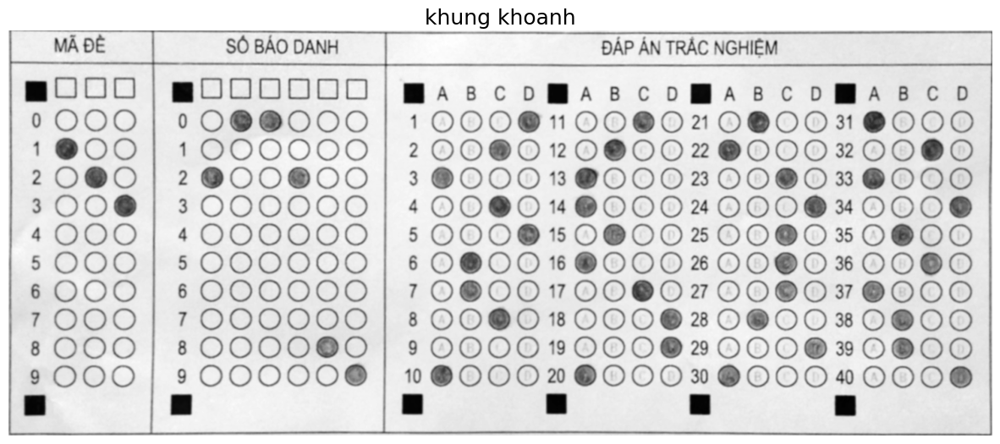

In [11]:
main2 = get_area(main1, 0)
show(main2, 'khung khoanh')

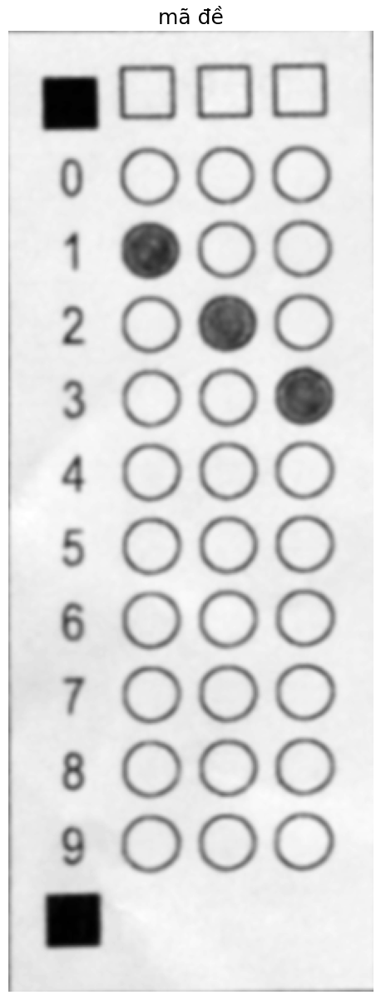

In [12]:
ma_de = get_area(main2, 3)
show(ma_de, title='mã đề')

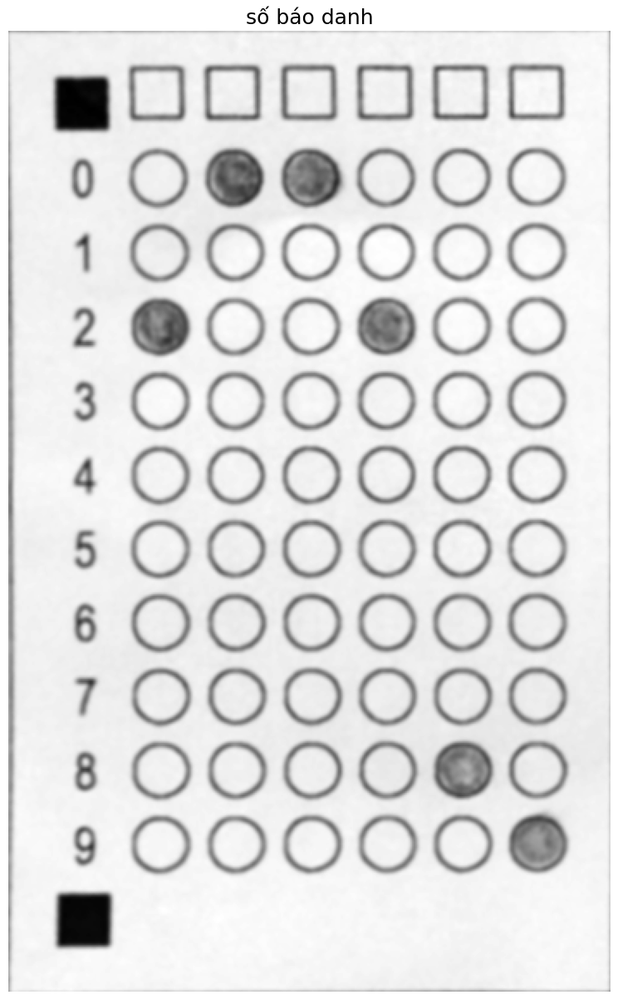

In [13]:
so_bd = get_area(main2, 2)
show(so_bd, title='số báo danh')

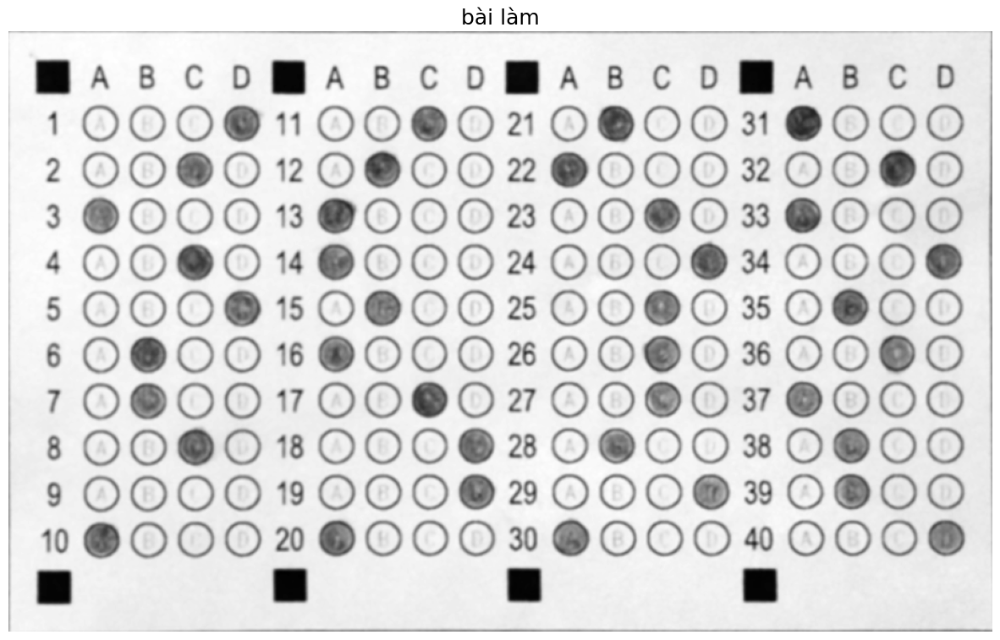

In [14]:
bai_lam = get_area(main2, 1)
show(bai_lam, title='bài làm')

Tổng hợp code

In [15]:
def task_2(img):
    '''Lấy các phần tô đen của bài làm
    - Input: Ảnh xám.
    - Outut: 3 Ảnh xám lần lượt là: mã đề, số báo danh và bài làm trắc nghiệm. '''
    def distance(p1,p2):
        my_dist = np.sqrt(((p1[0] - p2[0]) ** 2) + ((p1[1] - p2[1]) ** 2))
        return  my_dist
        
    def order_points(pts):
        rect = np.zeros((4, 2), dtype="float32")
        s = pts.sum(axis=1)
        rect[0] = pts[np.argmin(s)]
        rect[2] = pts[np.argmax(s)]

        diff = np.diff(pts, axis=1)
        rect[1] = pts[np.argmin(diff)]
        rect[3] = pts[np.argmax(diff)]

        return rect

    def four_point_transform(image, pts):
        rect = order_points(pts)
        (tl, tr, br, bl) = rect

        widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
        widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
        maxWidth = max(int(widthA), int(widthB))

        heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
        heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
        maxHeight = max(int(heightA), int(heightB))

        dst = np.array([[0, 0],
                        [maxWidth - 1, 0],
                        [maxWidth - 1, maxHeight - 1],
                        [0, maxHeight - 1]], dtype = "float32")
        M = cv2.getPerspectiveTransform(rect, dst)
        warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
        return warped

    def find_corner_by_rotated_rect(box,approx):
        corner = []
        for p_box in box:
            min_dist = 999999999
            min_p = None
            for p in approx:
                dist = distance(p_box, p[0])
                if dist < min_dist:
                    min_dist = dist
                    min_p = p[0]
            corner.append(min_p)

        corner = np.array(corner)
        return corner
    def get_area(img, id):
        thresh = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 31, 3)
        cnts = cv2.findContours(thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[0]
        cnts = sorted(cnts, key=lambda x: cv2.contourArea(x),reverse=True)
        approx = cv2.approxPolyDP(cnts[id], 0.01 * cv2.arcLength(cnts[id], True), True)
        rect = cv2.minAreaRect(cnts[id])
        box = cv2.boxPoints(rect)
        corner = find_corner_by_rotated_rect(box, approx)
        res = four_point_transform(img, corner)
        return res
    main1 = get_area(img, 1)
    main2 = get_area(main1, 0)

    bai_lam = get_area(main2, 1)
    so_bd = get_area(main2, 2)
    ma_de = get_area(main2, 3)
    
    return ma_de, so_bd, bai_lam

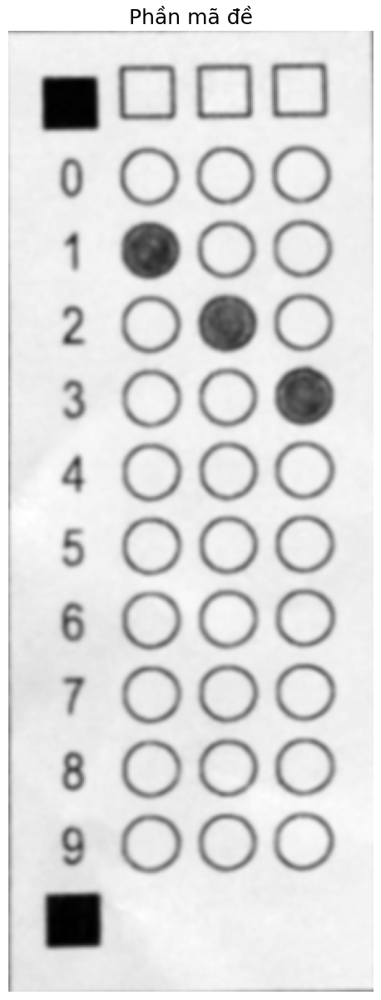

In [16]:
made2 = task_2(img)[0]
show(made2, 'Phần mã đề')

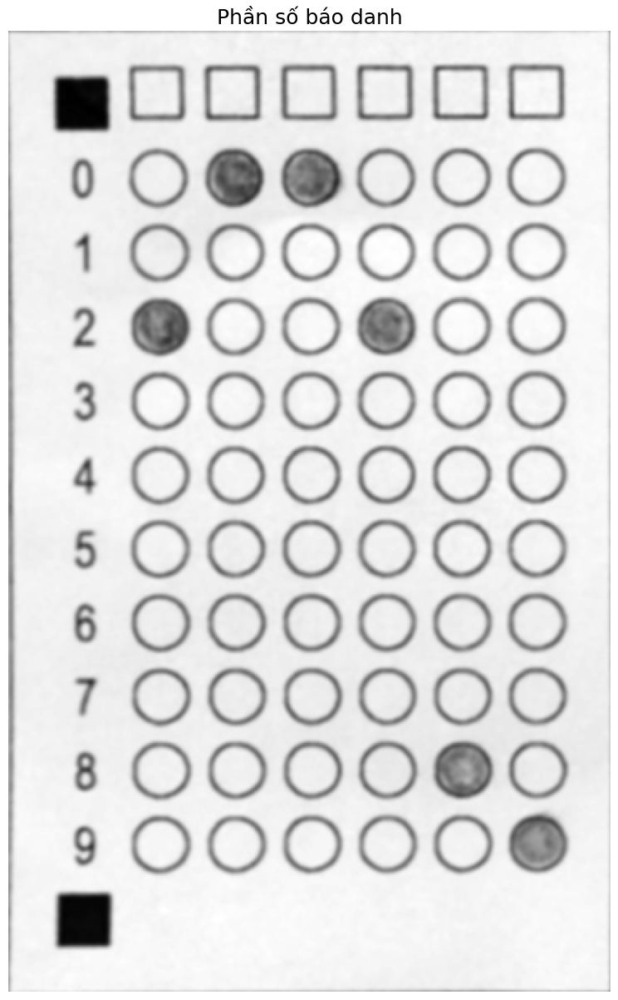

In [17]:
sbd2 = task_2(img)[1]
show(sbd2, 'Phần số báo danh')

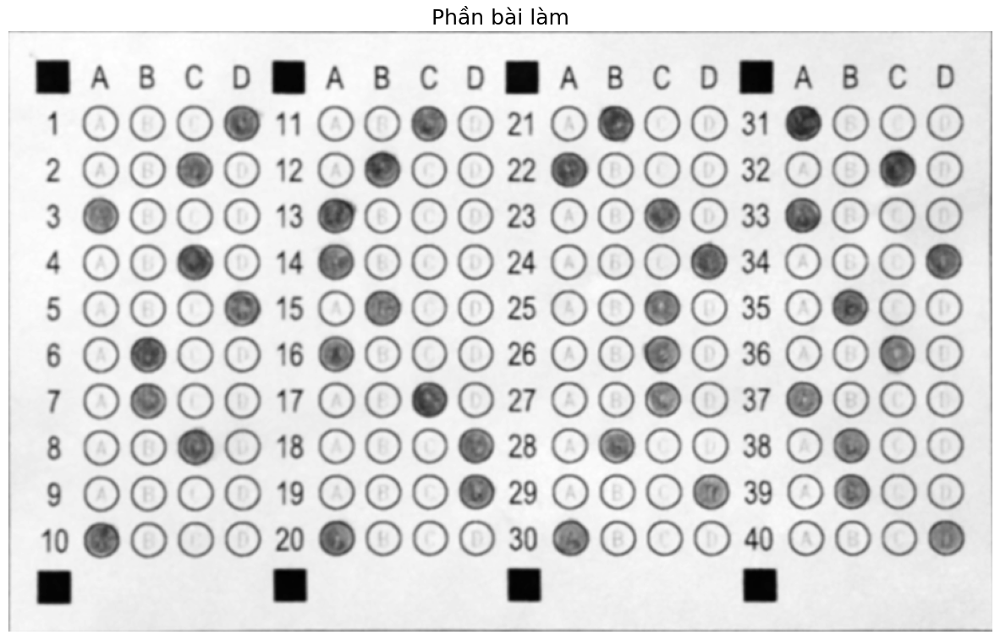

In [18]:
bailam2 = task_2(img)[2]
show(bailam2, 'Phần bài làm')

# Task 3: xử lí tăng cường đối tượng tô đen

-đọc thêm tăng cường ánh sáng

In [19]:
import cv2
import numpy as np
# from matplotlib import pyplot as plt
 
def convertScale(img, alpha, beta):
    """Add bias and gain to an image with saturation arithmetics. Unlike
    cv2.convertScaleAbs, it does not take an absolute value, which would lead to
    nonsensical results (e.g., a pixel at 44 with alpha = 3 and beta = -210
    becomes 78 with OpenCV, when in fact it should become 0).
    """
 
    new_img = img * alpha + beta
    new_img[new_img < 0] = 0
    new_img[new_img > 255] = 255
    return new_img.astype(np.uint8)
 
# Automatic brightness and contrast optimization with optional histogram clipping
def automatic_brightness_and_contrast(image, clip_hist_percent=25):
 
    # Calculate grayscale histogram
    hist = cv2.calcHist([gray],[0],None,[256],[0,256])
    hist_size = len(hist)
 
    # Calculate cumulative distribution from the histogram
    accumulator = []
    accumulator.append(float(hist[0]))
    for index in range(1, hist_size):
        accumulator.append(accumulator[index -1] + float(hist[index]))
 
    # Locate points to clip
    maximum = accumulator[-1]
    clip_hist_percent *= (maximum/100.0)
    clip_hist_percent /= 2.0
 
    # Locate left cut
    minimum_gray = 0
    while accumulator[minimum_gray] < clip_hist_percent:
        minimum_gray += 1
 
    # Locate right cut
    maximum_gray = hist_size -1
    while accumulator[maximum_gray] >= (maximum - clip_hist_percent):
        maximum_gray -= 1
 
    # Calculate alpha and beta values
    alpha = 255 / (maximum_gray - minimum_gray)
    beta = -minimum_gray * alpha
 
    '''
    # Calculate new histogram with desired range and show histogram 
    new_hist = cv2.calcHist([gray],[0],None,[256],[minimum_gray,maximum_gray])
    plt.plot(hist)
    plt.plot(new_hist)
    plt.xlim([0,256])
    plt.show()
    '''
 
    auto_result = convertScale(image, alpha=alpha, beta=beta)
    return (auto_result, alpha, beta)
 

made, alpha, beta = automatic_brightness_and_contrast(sbd2)
print('alpha', alpha)
print('beta', beta)


alpha 6.219512195121951
beta -765.0


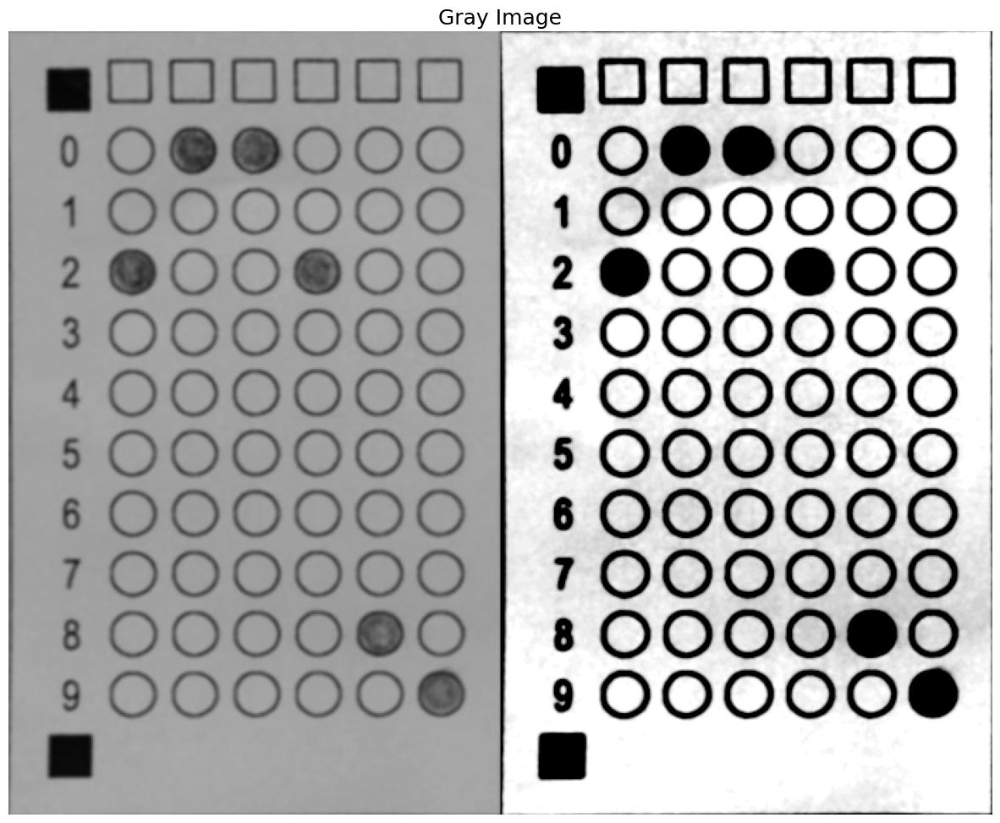

In [20]:
show(np.hstack((sbd2, made)))

In [21]:
# These are probably the only important parameters in the
# whole pipeline (steps 0 through 3).
BLOCK_SIZE = 40
DELTA = 25
 
# Do the necessary noise cleaning and other stuffs.
# I just do a simple blurring here but you can optionally
# add more stuffs.
def preprocess(image):
    image = cv2.medianBlur(image, 3)
    return 255 - image
 
# Again, this step is fully optional and you can even keep
# the body empty. I just did some opening. The algorithm is
# pretty robust, so this stuff won't affect much.
def postprocess(image):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))#np.ones((3,3), np.uint8)
    image = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
    return image
 
# Just a helper function that generates box coordinates
def get_block_index(image_shape, yx, block_size): 
    y = np.arange(max(0, yx[0]-block_size), min(image_shape[0], yx[0]+block_size))
    x = np.arange(max(0, yx[1]-block_size), min(image_shape[1], yx[1]+block_size))
    return np.meshgrid(y, x)
 
# Here is where the trick begins. We perform binarization from the 
# median value locally (the img_in is actually a slice of the image). 
# Here, following assumptions are held:
#   1.  The majority of pixels in the slice is background
#   2.  The median value of the intensity histogram probably
#       belongs to the background. We allow a soft margin DELTA
#       to account for any irregularities.
#   3.  We need to keep everything other than the background.
#
# We also do simple morphological operations here. It was just
# something that I empirically found to be "useful", but I assume
# this is pretty robust across different datasets.
def adaptive_median_threshold(img_in):
    med = np.median(img_in)
    img_out = np.zeros_like(img_in)
    img_out[img_in - med < DELTA] = 255
    
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    img_out = cv2.dilate(img_out, kernel, iterations = 2)
    return img_out
 
# This function just divides the image into local regions (blocks),
# and perform the `adaptive_mean_threshold(...)` function to each
# of the regions.
def block_image_process(image, block_size):
    out_image = np.zeros_like(image)
    for row in range(0, image.shape[0], block_size):
        for col in range(0, image.shape[1], block_size):
            idx = (row, col)
            block_idx = get_block_index(image.shape, idx, block_size)
            out_image[block_idx] = adaptive_median_threshold(image[block_idx])
    return out_image
 
# This function invokes the whole pipeline of Step 2.
def process_image(img):
    image_in = preprocess(img)
    image_out = block_image_process(image_in, BLOCK_SIZE)
    image_out = postprocess(image_out)
    return image_out

# dt1 = process_image(made)
# show(dt1)

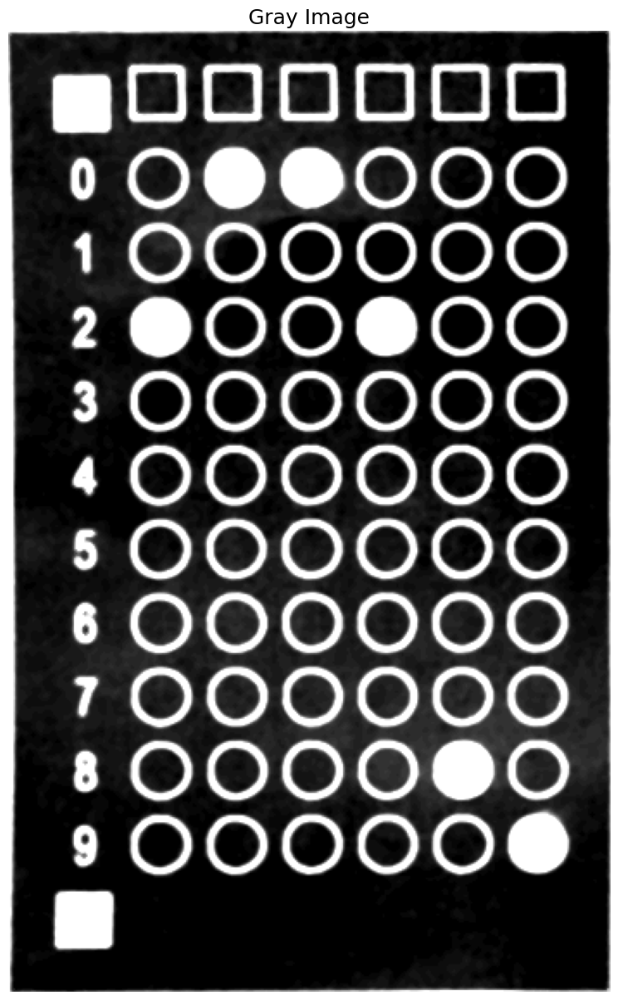

In [22]:
x = preprocess(made)
show(x)

1. Sử dụng phương pháp cân bằng histogram để làm rõ dấu tô chì

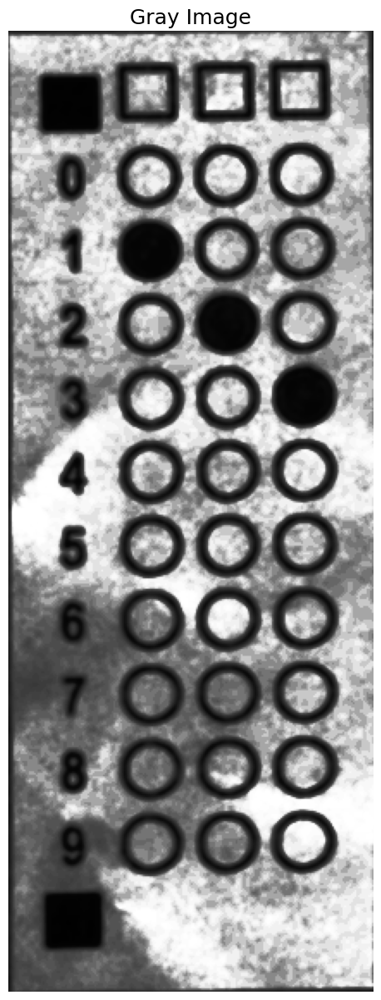

In [23]:
made_hist = cv2.equalizeHist(made2)
show(made_hist)

In [24]:
def show_hist(gray, equ, categori, cdf1 = [], cdf2 = []):
    f = plt.figure(figsize=(20, 15))
    f.add_subplot(2, 2, 1, xticks = [], yticks=[]).set_title('Gray Image')
    plt.imshow(gray, cmap = 'gray')
    f.add_subplot(2, 2, 2).set_title('Histogram Gray Image')
    histogram, bin_edges = np.histogram(gray, bins=256, range=(0, 256))
    plt.plot(bin_edges[:-1], histogram/np.max(histogram))
    if len(cdf1) > 0:
        plt.plot(cdf1, color = 'red')
    plt.xlabel('pixel')
    plt.ylabel('percent')


    f.add_subplot(2, 2, 3, xticks = [], yticks=[]).set_title(f'{categori}')
    plt.imshow(equ, cmap = 'gray')
    f.add_subplot(2, 2, 4).set_title(f'Histogram {categori}')
    histogram, bin_edges = np.histogram(equ, bins=256, range=(0, 256))
    plt.plot(bin_edges[:-1], histogram/np.max(histogram))
    if len(cdf2) > 0:
        plt.plot(cdf2, color = 'red')
    plt.xlabel('pixel')
    plt.ylabel('percent')
    plt.show()

def get_cdf(img):
  hist = np.histogram(img, bins=256, range=(0, 256))[0]
  hist = hist/img.size
  cdf = np.cumsum(hist)
  return cdf

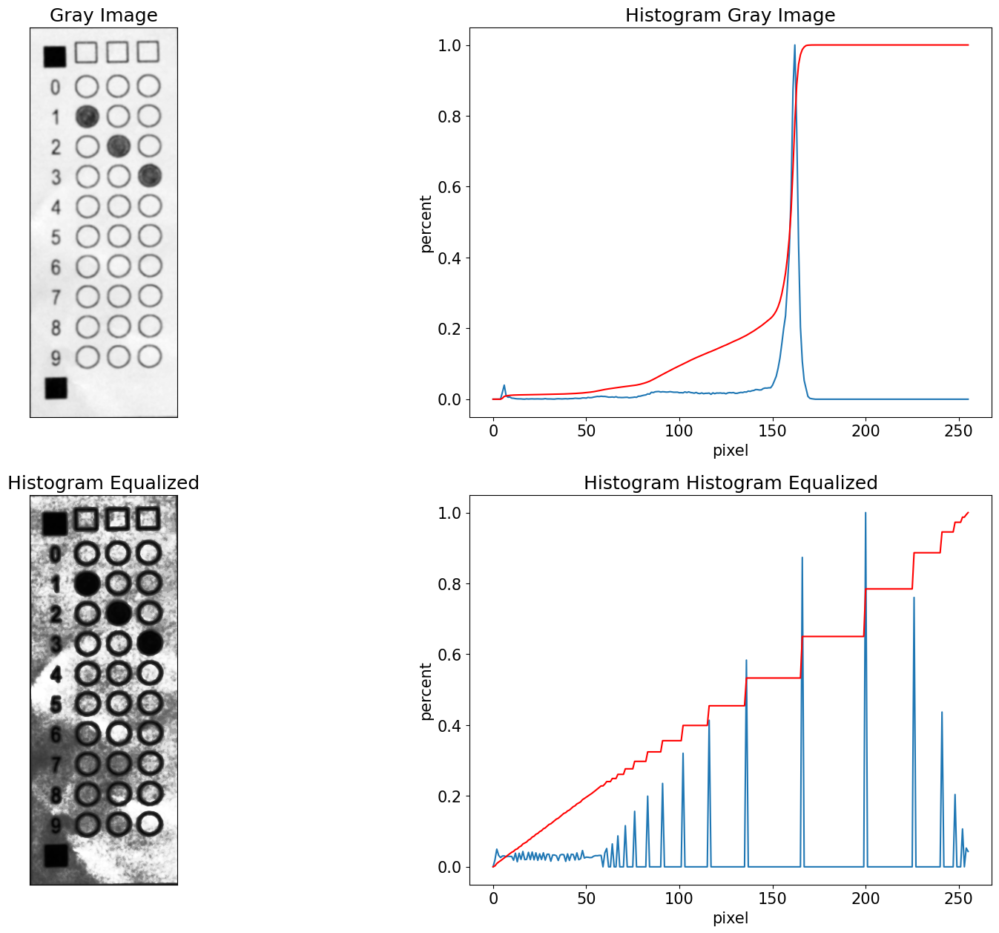

In [25]:
cdf1 = get_cdf(made2)
cdf2 = get_cdf(made_hist)
show_hist(made2, made_hist, 'Histogram Equalized', cdf1=cdf1, cdf2=cdf2)

2. Sử dụng ngưỡng để phân đoạn ảnh

In [26]:
t = cv2.threshold

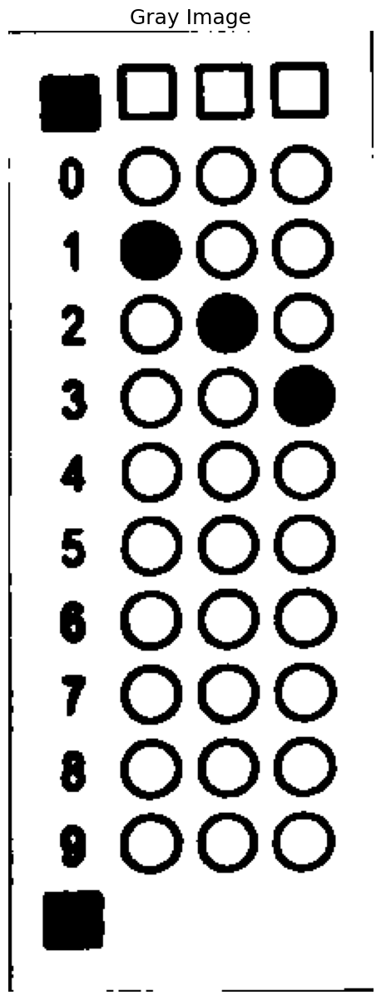

In [27]:
img_threshold = (made_hist > 50).astype(int)
show(img_threshold)

3. Xóa đường kẻ viền

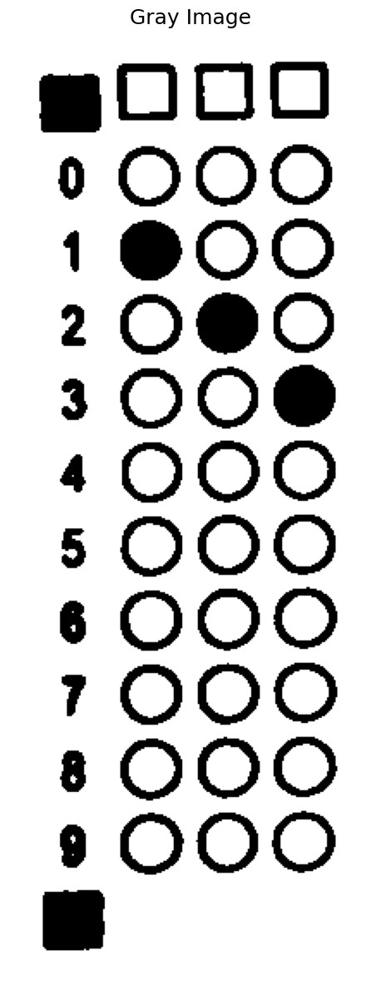

In [28]:
def xoa_vien(img, width):
    out = img.copy()
    out[:, :width] = 1
    out[:, -width:] = 1
    out[:width, :]= 1
    out[-width:, :] = 1
    return out.astype('uint8')


img_rm = xoa_vien(img_threshold, 10)
show(img_rm)

4. tăng cường viền và làm đầy lỗ trống

In [29]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
print(kernel)

[[0 1 0]
 [1 1 1]
 [0 1 0]]


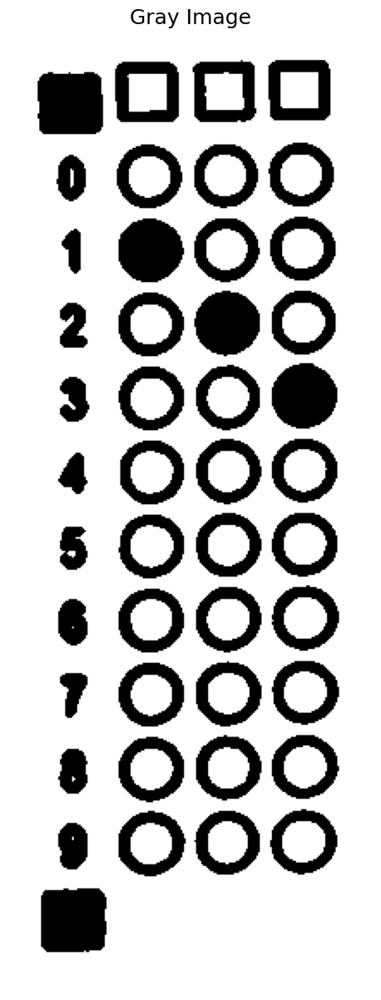

In [30]:
di = cv2.erode(img_rm, kernel)
show(di)

In [31]:
def task_3(img):
    '''Xử lí tăng cường viền.
    - Input: Ảnh xám phần tô đen.
    - Output: Ảnh nhị phân đã được làm đẹp.'''
    def convertScale(img, alpha, beta):
        """Add bias and gain to an image with saturation arithmetics. Unlike
        cv2.convertScaleAbs, it does not take an absolute value, which would lead to
        nonsensical results (e.g., a pixel at 44 with alpha = 3 and beta = -210
        becomes 78 with OpenCV, when in fact it should become 0).
        """
    
        new_img = img * alpha + beta
        new_img[new_img < 0] = 0
        new_img[new_img > 255] = 255
        return new_img.astype(np.uint8)
 
    # Automatic brightness and contrast optimization with optional histogram clipping
    def automatic_brightness_and_contrast(image, clip_hist_percent=25):
    
        # Calculate grayscale histogram
        hist = cv2.calcHist([gray],[0],None,[256],[0,256])
        hist_size = len(hist)
    
        # Calculate cumulative distribution from the histogram
        accumulator = []
        accumulator.append(float(hist[0]))
        for index in range(1, hist_size):
            accumulator.append(accumulator[index -1] + float(hist[index]))
    
        # Locate points to clip
        maximum = accumulator[-1]
        clip_hist_percent *= (maximum/100.0)
        clip_hist_percent /= 2.0
    
        # Locate left cut
        minimum_gray = 0
        while accumulator[minimum_gray] < clip_hist_percent:
            minimum_gray += 1
    
        # Locate right cut
        maximum_gray = hist_size -1
        while accumulator[maximum_gray] >= (maximum - clip_hist_percent):
            maximum_gray -= 1
    
        # Calculate alpha and beta values
        alpha = 255 / (maximum_gray - minimum_gray)
        beta = -minimum_gray * alpha
    
        '''
        # Calculate new histogram with desired range and show histogram 
        new_hist = cv2.calcHist([gray],[0],None,[256],[minimum_gray,maximum_gray])
        plt.plot(hist)
        plt.plot(new_hist)
        plt.xlim([0,256])
        plt.show()
        '''
    
        auto_result = convertScale(image, alpha=alpha, beta=beta)
        return auto_result
    

    # made = automatic_brightness_and_contrast(sbd2)

    def xoa_vien(img, width):
        out = img.copy()
        out[:, :width] = 1
        out[:, -width:] = 1
        out[:width, :]= 1
        out[-width:, :] = 1
        return out.astype('uint8')

    # hist = cv2.equalizeHist(img)
    hist = automatic_brightness_and_contrast(img)
    threshold = (hist > 50).astype(int)
    rm = xoa_vien(threshold, 10)
    kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (3, 3))
    eroded = cv2.erode(rm, kernel)
    return eroded

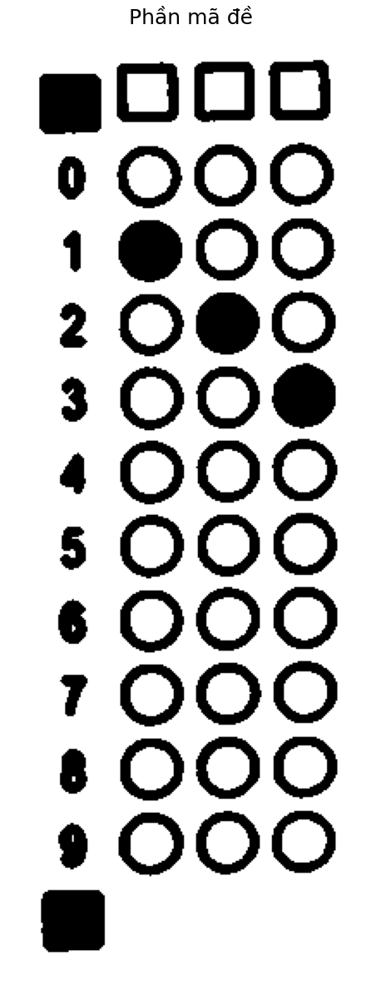

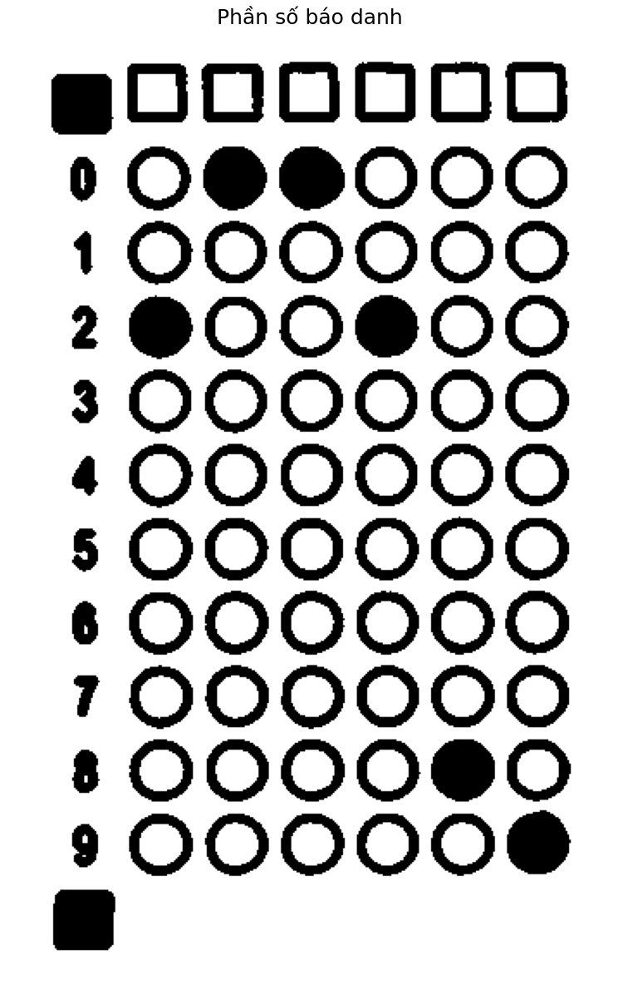

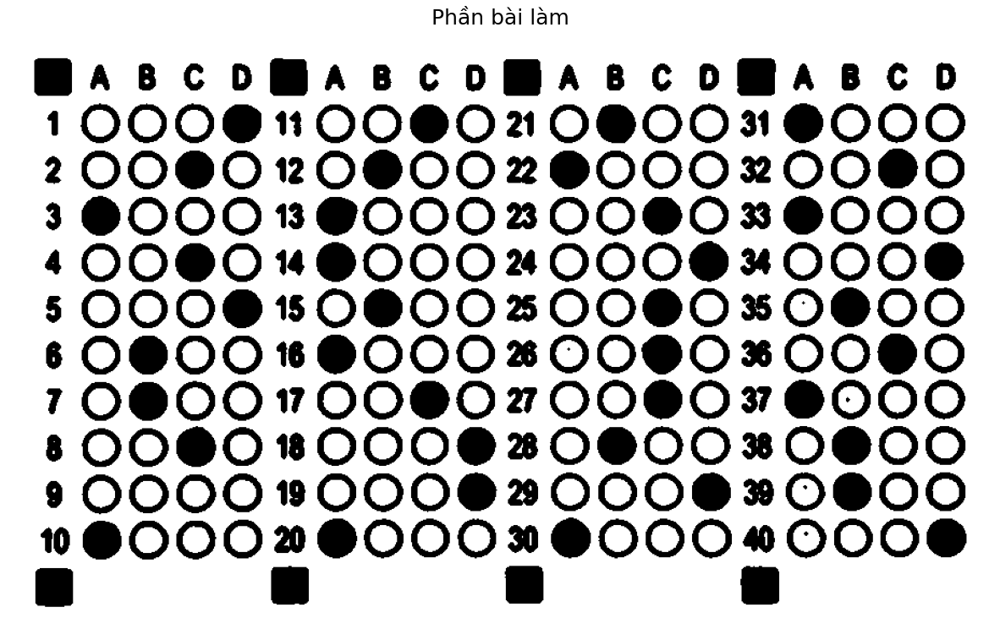

In [32]:
made3 = task_3(made2)
sbd3 = task_3(sbd2)
bailam3 = task_3(bailam2)

show(made3, 'Phần mã đề')
show(sbd3, 'Phần số báo danh')
show(bailam3, 'Phần bài làm')

# Task 4: nhận diện đối tượng

xử lí trên mã đề và số báo danh

1. phát hiện cạnh

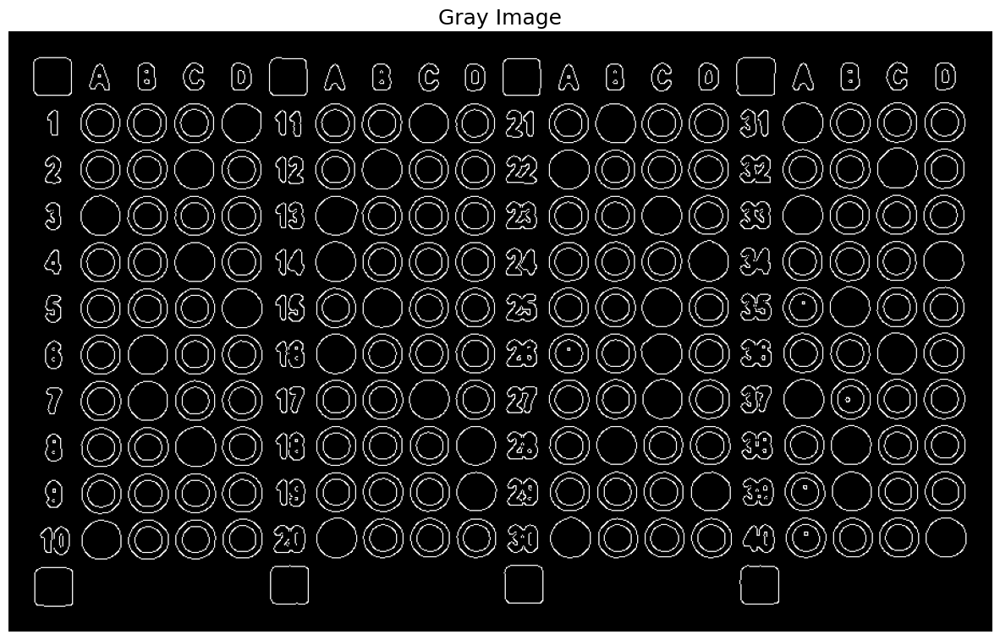

In [33]:
edge = cv2.Canny(bailam3, 0, 1)
show(edge)

2. xác định và vẽ contour

In [34]:
cv2.contourArea

<function contourArea>

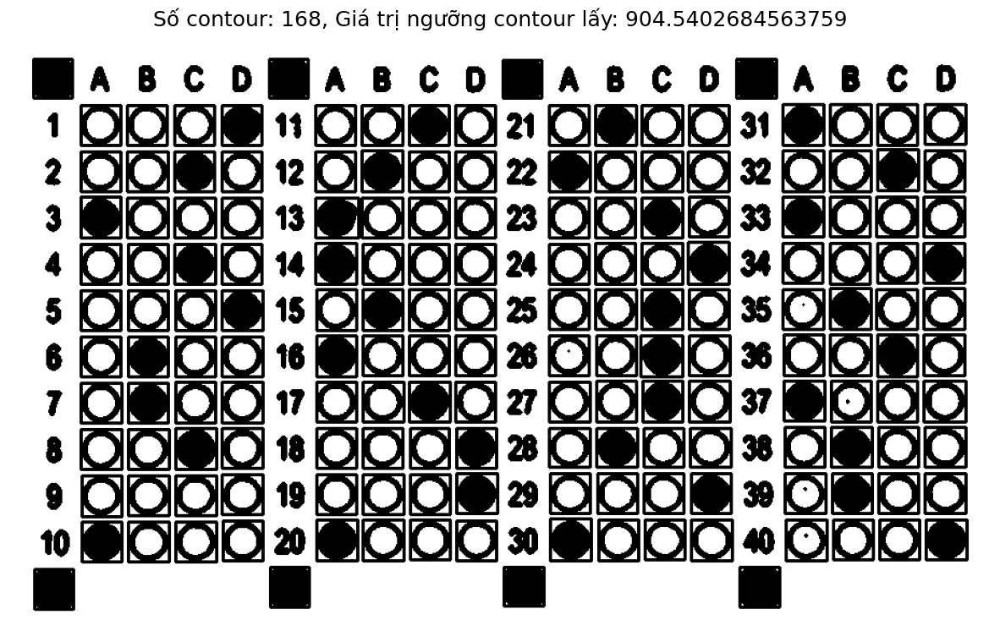

In [35]:
def get_area(cnt):
    return cnt[2]*cnt[3]
# phát hiện contour
cnts = cv2.findContours(edge, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)[0]

# vẽ contour
img_copy = bailam3.copy()
coordinates = []
t = np.mean([get_area(cv2.boundingRect(i)) for i in cnts])
# t = np.mean([cv2.contourArea(i) for i in cnts])
for c in cnts:
    # if cv2.contourArea(c) < t:
    if get_area(cv2.boundingRect(c)) > t:
        x,y,w,h = cv2.boundingRect(c)
        coordinates.append((x, y, w, h))
        cv2.rectangle(img_copy,(x,y),(x+w,y+h), 0, 2)

show(img_copy, f'Số contour: {len(coordinates)}, Giá trị ngưỡng contour lấy: {t}')

tổng hợp code

In [36]:
def task_4(img):
    '''Xử lí contour
    - Input: Ảnh đã phân đoạn nhị phân.
    - Output: Danh sách các (tọa độ x, tọa độ y, độ rộng và độ cao).'''
    def get_area(cnt):
        return cnt[2]*cnt[3]
    edge = cv2.Canny(img, 0, 1)
    cnts = cv2.findContours(edge, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)[0]

    coordinates = []
    # t = np.mean([get_area(cv2.boundingRect(i)) for i in cnts])
    t = np.mean([get_area(cv2.boundingRect(i)) for i in cnts])
    for c in cnts:
        if get_area(cv2.boundingRect(c)) > t:
            x,y,w,h = cv2.boundingRect(c)
            coordinates.append((x, y, w, h))
            
    return coordinates

In [37]:
made4 = task_4(made3)
sbd4 = task_4(sbd3)
bailam4 = task_4(bailam3)

# Task 5: đọc thông tin

## 1. Đọc phần mã đề và số báo danh

Note: 
- bit $0$ là màu đen
- bit $1$ là màu trắng

Giá trị contour: (cột, hàng, độ rộng, độ cao)

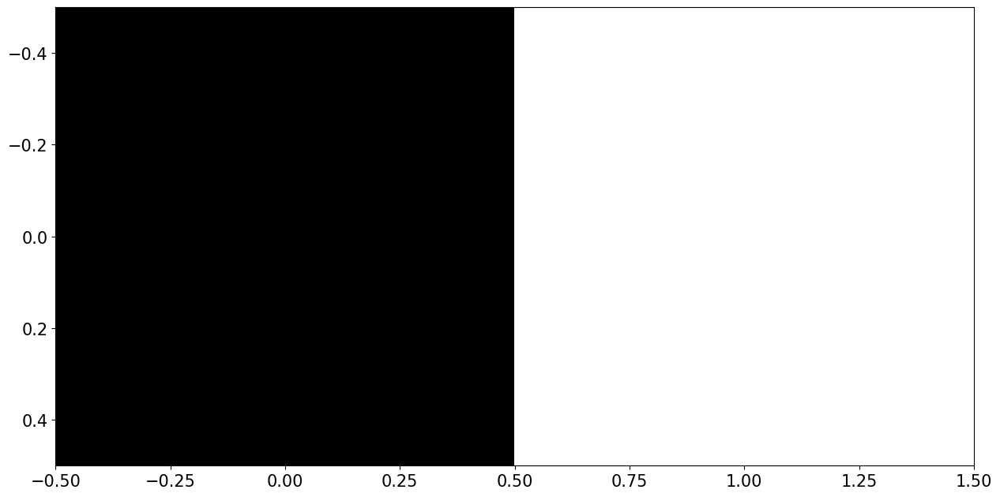

In [38]:
plt.imshow([[0, 1]], cmap=plt.cm.gray);

**Ý tưởng 1:** Sắp xếp các contour theo giá trị `x` và bỏ 2 chấm đen, rồi sắp xếp tiếp theo `y` và bỏ phần tử đầu.\
Ta sẽ lấy những điểm tô tròn và nhận biết.

![task 5](task51.png)

In [39]:
def toa_do_x(cnt):
    return cnt[0]

def toa_do_y(cnt):
    return cnt[1]

# sắp xếp theo x và y
cnts = made4
cnts_x = sorted(cnts, key=toa_do_x, reverse=True)
cnts_y = [sorted(cnts_x[11*i:11*(i+1)], key=toa_do_y, reverse=True) for i in range((len(cnts_x)-2)//11 + 1)]
out = [i[:10][::-1] for i in cnts_y[:-1]][::-1]

In [40]:
out[0][0]

(62, 66, 39, 37)

Lấy ngưỡng để biết đáp án khoanh có được cho là đã khoanh hay không

In [41]:
def check_fill(img):
    col, row, w, h = img
    obj = made3[row: row+w, col: col+h]
    s_ = np.sum(np.select([obj==0, obj==1], [1, 0]))
    s = np.sum(np.ones((obj.shape)))
    return s_, s, s_/s*100

In [42]:
no_fill = out[0][0]
check_fill(no_fill)

(545, 1443.0, 37.76853776853777)

In [43]:
1521.0*0.6

912.6

In [44]:
fill = out[0][1]
check_fill(fill)

(1054, 1406.0, 74.96443812233285)

In [45]:
1482.0*0.6

889.1999999999999

Chọn tỷ lệ $60\%$ làm ngưỡng

In [46]:
label = []
for i in range(len(out)):
    dem = 0
    for cnt in out[i]:
        col, row, w, h = cnt
        obj = made3[row: row+w, col: col+h]
        s_ = np.sum(np.select([obj==0, obj==1], [1, 0]))
        s = np.sum(np.ones((obj.shape)))
        if s_ > s*0.6:
            label.append(dem)
        dem+=1
detect = ''.join(map(lambda x: str(x), label))
detect

'123'

kiểm tra với hình thử

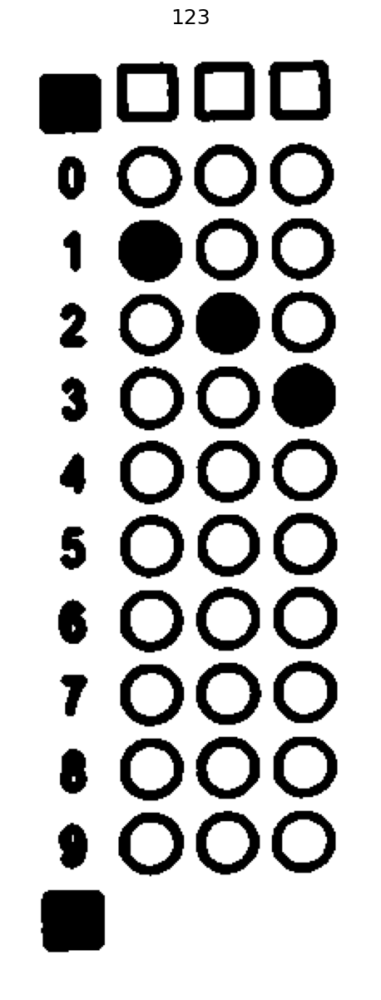

In [47]:
show(made3, detect)

Tổng hợp code

In [48]:
def task_5_1(img, cnts):
    '''Nhận diện lựa chọn của mã đề và số báo danh.
    - Input: Ảnh nhị phân và các contour.
    - Output: Chuỗi số và ảnh đã nhận dạng.'''
    
    def toa_do_x(cnt):
        return cnt[0]

    def toa_do_y(cnt):
        return cnt[1]

    # sắp xếp theo x và y
    cnts_x = sorted(cnts, key=toa_do_x, reverse=True)
    cnts_y = [sorted(cnts_x[11*i:11*(i+1)], key=toa_do_y, reverse=True) for i in range((len(cnts_x)-2)//11 + 1)]
    out = [i[:10][::-1] for i in cnts_y[:-1]][::-1]
    coordinates = []
    label = []
    for i in range(len(out)):
        dem = 0
        check = True
        for cnt in out[i]:
            col, row, w, h = cnt
            obj = img[row: row+w, col: col+h]
            s_ = np.sum(np.select([obj==0, obj==1], [1, 0]))
            s = np.sum(np.ones((obj.shape)))
            if s_ > s*0.6:
                check = False
                label.append(dem)
                coordinates.append((col, row, w, h))
            dem+=1
        if check:
            label.append('-')
    detect = ''.join(map(lambda x: str(x), label))

    img_copy = img.copy()
    for i in coordinates:
        x,y,w,h = i
        cv2.rectangle(img_copy,(x,y),(x+w,y+h), 0, 2)

    return detect, img_copy

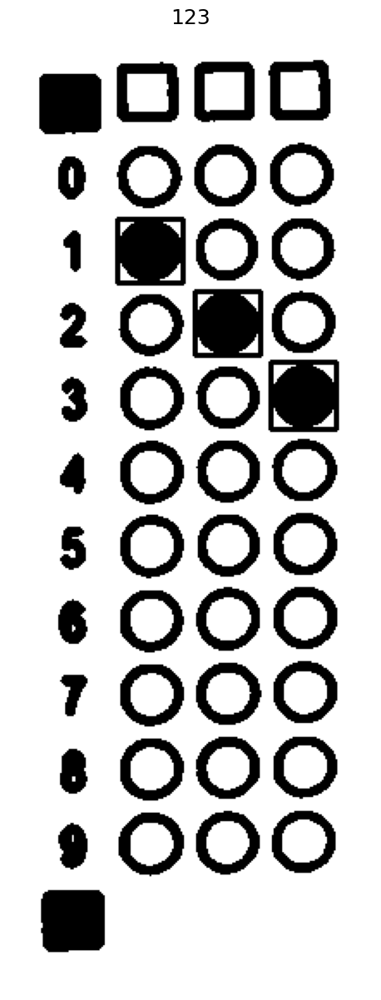

In [49]:
inf4, img = task_5_1(made3, made4)
show(img, inf4)

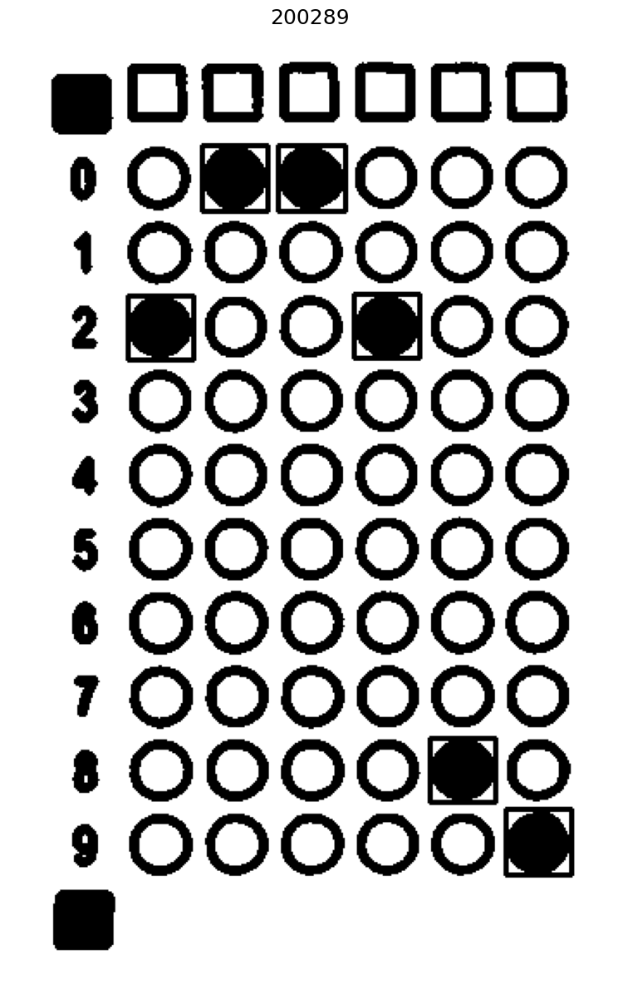

In [50]:
inf4, img = task_5_1(sbd3, sbd4)
show(img, inf4)

## 2. Đọc phần bài làm trắc nghiệm

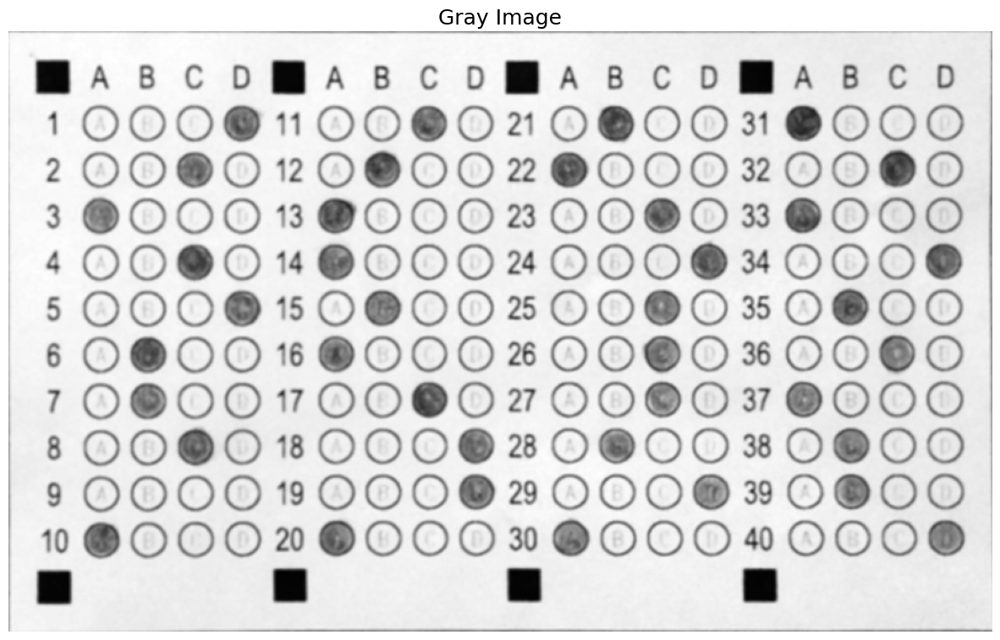

In [51]:
show(bailam2)

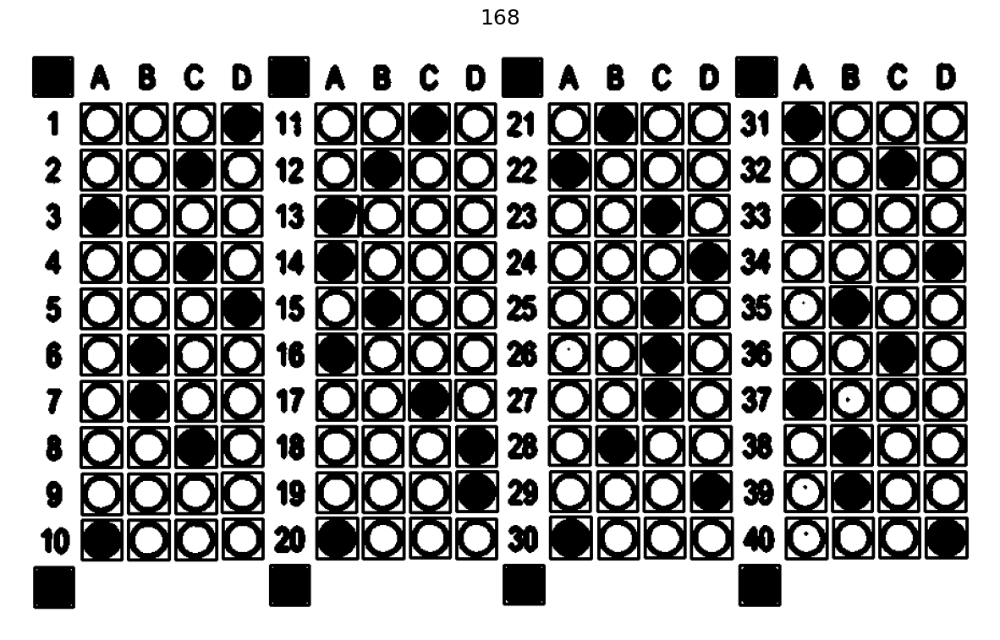

In [52]:
# vẽ contour
img_copy = bailam3.copy()
for i in bailam4:
    x,y,w,h = i
    cv2.rectangle(img_copy,(x,y),(x+w,y+h), 0, 2)
show(img_copy, len(bailam4))

Ý tưởng tương tự cách trên nhưng cắt theo chiều ngang

In [53]:
solve = {1:'D', 2:'C', 3:'A', 4:'C', 5:'D', 6:'B', 7:'B', 8:'C', 9:'C', 10:'A',
        11:'C', 12:'B', 13:'A', 14:'A', 15:'B', 16:'A', 17:'C', 18:'D', 19:'D', 20:'A',
        21:'B', 22:'A', 23:'C', 24:'D', 25:'C', 26:'C', 27:'C', 28:'B', 29:'D', 30:'A',
        31:'A', 32:'C', 33:'A', 34:'D', 35:'B', 36:'C', 37:'A', 38:'B', 39:'B', 40:'D'}

Tổng hợp code

In [54]:
def task_5_2(img, cnts, solve):
    '''
    - Input: Ảnh nhị phân, các contour và từ điển đáp án.
    - Output: Kết quả, ảnh đã nhận dạng và điểm số'''
    
    def toa_do_x(cnt):
        return cnt[0]

    def toa_do_y(cnt):
        return cnt[1]

    # sắp xếp theo x và y
    cnts_x = sorted(cnts, key=toa_do_y, reverse=True)[4:-4]
    cnts_y = [sorted(cnts_x[16*i: 16*(i+1)], key=toa_do_x) for i in range(10)]
    out = cnts_y[::-1]

    coordinates = []
    label = {1: 'A', 2: 'B', 3: 'C', 4: 'D'}
    result = {}
    for i1, r in enumerate(out): # lặp theo hàng: 10 
        for k in range(4):
            check = 0
            coor_temp = []
            dem = 0
            prb = [r[4*i: 4*(i+1)] for i in range(4)]
            for id, j in enumerate(prb[k]):
                col, row, w, h = j
                obj = bailam3[row: row+w, col: col+h]
                s_ = np.sum(np.select([obj==0, obj==1], [1, 0]))
                s = np.sum(np.ones((obj.shape)))
                if s_ > s*0.6:
                    check += 1
                    coor_temp.append((col, row, w, h))
                    dem = id+1
            if check == 1:
                result[k*10 + i1 + 1] = label[dem]
                coordinates.extend(coor_temp)
            else:
                result[k*10 + i1 + 1] = '-'

    s = 0
    for i in range(40):
        if solve[i+1]==result[i+1]:
            s+=1
    point = (s/40)*10

    img_copy = img.copy()
    for i in coordinates:
        x,y,w,h = i
        cv2.rectangle(img_copy,(x,y),(x+w,y+h), 0, 2)

    return img_copy, result, point

In [55]:
img, res, point = task_5_2(bailam3, bailam4, solve)

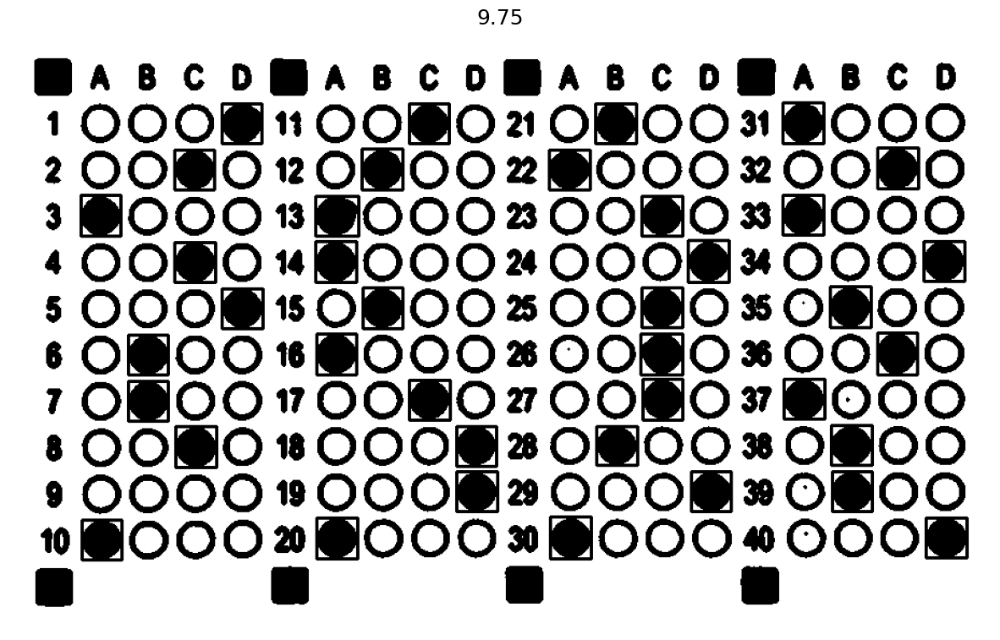

In [56]:
show(img, point)

# Thử nghiệm

Ảnh  (23, 24, 36, 36)


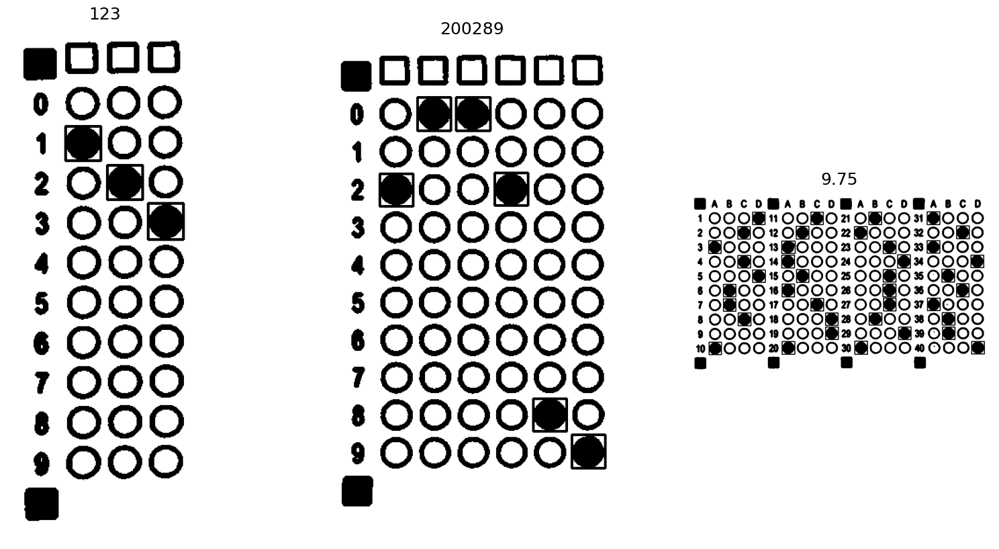

In [57]:
t1 = task_1(f'demo{4}.jpg')
t2 = task_2(t1)
t3_md = task_3(t2[0])
t3_sbd = task_3(t2[1])
t3_bl = task_3(t2[2])
t4_md = task_4(t3_md)
t4_sbd = task_4(t3_sbd)
t4_bl = task_4(t3_bl)
t5_md = task_5_1(t3_md, t4_md)
t5_sbd = task_5_1(t3_sbd, t4_sbd)
t5_bl = task_5_2(t3_bl, t4_bl, solve)
print('Ảnh ', i)
f = plt.figure(figsize=(20, 10))
for i, tl, ig in zip(range(3), [t5_md[0], t5_sbd[0], t5_bl[2]], [t5_md[1], t5_sbd[1], t5_bl[0]]):
    f.add_subplot(1, 3, i+1).set_title(tl)
    plt.axis('off')
    plt.imshow(ig, cmap=plt.cm.gray)
# f.add_subplot(1, 2, 1)

plt.show()